In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from collections import Counter
from sklearn.base import clone
from sklearn.cluster import MeanShift, estimate_bandwidth

from datetime import datetime
import matplotlib.pyplot as plt
from math import ceil
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from pandas_profiling import ProfileReport

In [3]:
df = pd.read_sas('a2z_insurance.sas7bdat')
df.set_index('CustID', inplace=True)

In [4]:
df.head(5)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [5]:
df.shape

(10296, 13)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10279 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [7]:
non_metric_features = ["EducDeg", "Children", 'GeoLivArea']
metric_features=df.columns.drop(non_metric_features).to_list()

In [8]:
df_info = pd.DataFrame(columns={"column", "NaN", "NaN %"})
for index, value in df.isna().sum().iteritems():
    df_temp = pd.DataFrame({"column" : index, "NaN" : [value], "NaN %" : round(value*100 /len(df), 2)})
    df_info = pd.concat([df_info, df_temp], ignore_index=True)
    df_info.sort_values(by="NaN", ascending=False, inplace=True)

print(df_info)

    NaN         column NaN %
0   104       PremLife  1.01
12   86       PremWork  0.84
1    43     PremHealth  0.42
2    36       MonthSal  0.35
3    34      PremMotor  0.33
4    30   FirstPolYear  0.29
5    21       Children   0.2
6    17      BirthYear  0.17
7    17        EducDeg  0.17
8     1     GeoLivArea  0.01
9     0     CustMonVal   0.0
10    0     ClaimsRate   0.0
11    0  PremHousehold   0.0


### %%%% explicar que como nenhuma coluna tem mais de 3% de Nans, não eliminamos os nans, vamos imputar

In [9]:
#Check duplicates
df.duplicated().sum()

3

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
#Check duplicates
df.duplicated().sum()

0

# Fill Nans
### This data doesn't have a lot of missing values, but we will fill them with 4 different approaches and then test it when doing clusters
#### For each approach we are going to plot a range of data (using the metric with more missing values VS another metric), so that it is possible to identify the missing values ​​filled in. Since if we showed all the data, it would be impossible to see them graphically
#### All filled missing values are going to be plotted in red color

### - Using mode for both metric and non metric:

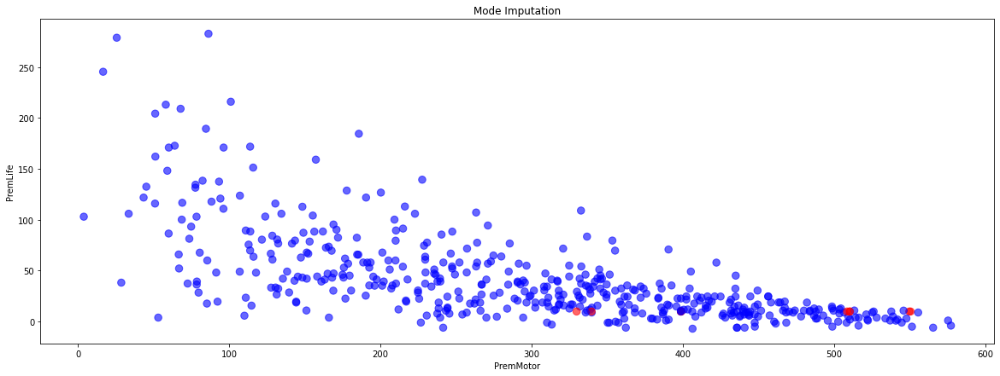

In [12]:
# # Mode Imputation

# df_mode = df.copy()
# mode_imputer = SimpleImputer(strategy='most_frequent')
# df_mode[metric_features] = mode_imputer.fit_transform(df_mode[metric_features].values)
# df_mode[non_metric_features] = mode_imputer.fit_transform(df_mode[non_metric_features].values)

# # Scatter plot

# fig = plt.Figure()
# null_values = df['PremLife'].isnull()
# fig = df_mode[4020:4502].plot(x='PremMotor', y='PremLife', kind='scatter', c=null_values[4020:4502], cmap='bwr', title='Mode Imputation', colorbar=False, alpha=0.6, figsize=(20,7), s=72)


### - Using mean for metric and mode for non metric:

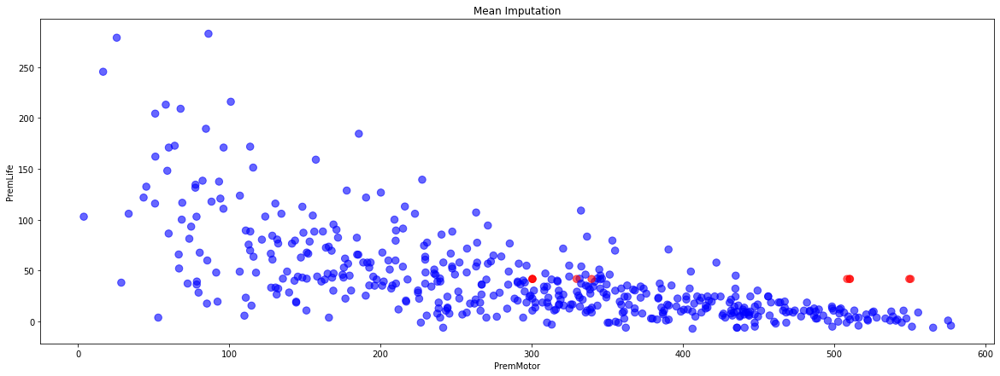

In [13]:
# # Mean Imputation

# df_mean = df.copy()
# mean_imputer = SimpleImputer(strategy='mean')
# df_mean[metric_features] = mean_imputer.fit_transform(df_mean[metric_features].values)
# df_mean[non_metric_features] = mode_imputer.fit_transform(df_mean[non_metric_features].values)


# # Scatter plot

# fig = plt.Figure()
# null_values = df['PremLife'].isnull()
# fig = df_mean[4020:4502].plot(x='PremMotor', y='PremLife', kind='scatter', c=null_values[4020:4502], cmap='bwr', title='Mean Imputation', colorbar=False, alpha=0.6, figsize=(20,7), s=72)



### - Using KNN Imputer for both metric and non metric:

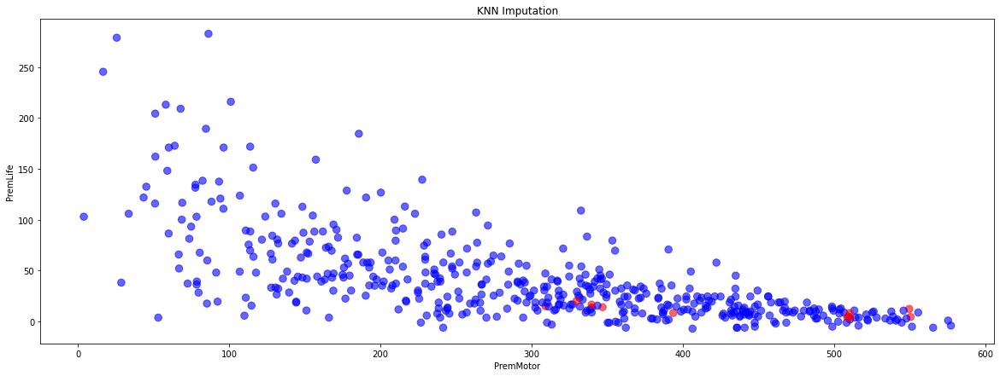

In [14]:
df_kmeans=df.copy()

le=LabelEncoder()

imputer = KNNImputer(n_neighbors=5, weights="uniform")
df_kmeans[metric_features] = imputer.fit_transform(df_kmeans[metric_features])

dict_educdeg = {b'3 - BSc/MSc' : 3,  b'2 - High School' : 2, b'1 - Basic': 1 , b'4 - PhD': 4}
df_kmeans.replace({"EducDeg": dict_educdeg}, inplace=True)

# df_kmeans['EducDeg']=df_kmeans['EducDeg'].astype(int)

df_kmeans[non_metric_features] = imputer.fit_transform(df_kmeans[non_metric_features])

#round new values to one of the labels
df_kmeans['EducDeg']=df_kmeans['EducDeg'].round(0)
df_kmeans['Children']=df_kmeans['Children'].round(0)
df_kmeans['GeoLivArea']=df_kmeans['GeoLivArea'].round(0)


dict_educdeg = {3 : b'3 - BSc/MSc', 2: b'2 - High School',1 :  b'1 - Basic' , 4 : b'4 - PhD'}
df_kmeans.replace({"EducDeg": dict_educdeg}, inplace=True)


# Scatter plot

fig = plt.Figure()
null_values = df['PremLife'].isnull()
fig = df_kmeans[4020:4502].plot(x='PremMotor', y='PremLife', kind='scatter', c=null_values[4020:4502], cmap='bwr', title='KNN Imputation', colorbar=False, alpha=0.6, figsize=(20,7), s=72)


### - Using linear interpolation for both metric and non metric:

<AxesSubplot:title={'center':'PremLife'}, xlabel='CustID'>

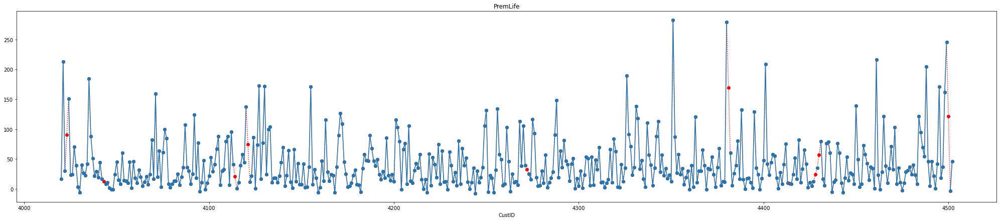

In [15]:
# df_interpolation=df.copy()
# # Imputing with linear interpolation
# linear_interpolation = df_interpolation.interpolate(method='linear')

# # Plot imputed data

# linear_interpolation['PremLife'][4020:4502].plot(color='red', marker='o', linestyle='dotted')
# df_interpolation['PremLife'][4020:4502].plot(title='PremLife', marker='o', figsize=(35,7))

In [16]:
df_filled=df_kmeans.copy()

In [17]:
#convert some variables to int
df_filled = df_filled.astype({'FirstPolYear': int, 'BirthYear': int, 'MonthSal': int , 'GeoLivArea': int, 'Children': int})
#convert index to int
df_filled.index = df_filled.index.astype(int)

In [18]:
df_filled.sample(5)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5859,1981,1993,b'1 - Basic',880,2,1,171.04,0.76,172.59,322.85,212.15,70.57,47.12
3070,1994,1976,b'3 - BSc/MSc',1826,3,1,230.05,0.76,121.58,642.35,56.90,88.35,166.70
816,1977,1963,b'3 - BSc/MSc',2703,4,1,25.90,0.92,283.72,33.35,178.81,27.45,78.35
719,1992,1983,b'3 - BSc/MSc',1825,4,1,90.57,0.80,194.37,25.00,268.83,69.57,34.23
5211,1975,1965,b'2 - High School',2896,4,1,501.32,0.19,512.54,57.80,49.23,13.78,16.89


In [19]:
#Check if Nans were all filled
df_filled.isna().sum()

FirstPolYear     0
BirthYear        0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [20]:
# print columns with Nans
nans_index = df.isna().any(axis=1)
df[nans_index]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
22.0,1977.0,1958.0,b'2 - High School',NaN,3.0,1.0,111.37,0.80,407.52,111.70,100.13,24.67,30.34
69.0,1983.0,1977.0,b'2 - High School',1399.0,4.0,1.0,476.65,0.33,330.73,186.70,211.15,NaN,15.78
139.0,1979.0,1976.0,b'2 - High School',2538.0,2.0,1.0,149.59,0.69,194.26,305.60,NaN,37.34,17.67
144.0,1996.0,1990.0,b'3 - BSc/MSc',NaN,4.0,1.0,-42.45,1.02,146.36,353.95,220.04,121.80,42.01
185.0,1993.0,1984.0,b'2 - High School',2419.0,4.0,1.0,-62.23,1.07,NaN,253.95,230.60,5.89,43.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10011.0,NaN,1947.0,b'2 - High School',3959.0,2.0,NaN,-128.24,1.14,177.81,153.35,311.28,67.79,35.45
10058.0,1983.0,1980.0,b'2 - High School',1569.0,4.0,1.0,222.60,0.55,235.60,211.15,NaN,32.34,68.79
10143.0,1986.0,1985.0,b'3 - BSc/MSc',1652.0,3.0,1.0,55.67,0.88,257.05,94.45,308.39,NaN,13.78


In [21]:
#print the same columns with Nans filled
df_filled[nans_index]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
22,1977,1958,b'2 - High School',2541,3,1,111.37,0.80,407.520,111.70,100.130,24.670,30.340
69,1983,1977,b'2 - High School',1399,4,1,476.65,0.33,330.730,186.70,211.150,33.784,15.780
139,1979,1976,b'2 - High School',2538,2,1,149.59,0.69,194.260,305.60,226.598,37.340,17.670
144,1996,1990,b'3 - BSc/MSc',1721,4,1,-42.45,1.02,146.360,353.95,220.040,121.800,42.010
185,1993,1984,b'2 - High School',2419,4,1,-62.23,1.07,264.428,253.95,230.600,5.890,43.120
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10011,1990,1947,b'2 - High School',3959,2,1,-128.24,1.14,177.810,153.35,311.280,67.790,35.450
10058,1983,1980,b'2 - High School',1569,4,1,222.60,0.55,235.600,211.15,247.602,32.340,68.790
10143,1986,1985,b'3 - BSc/MSc',1652,3,1,55.67,0.88,257.050,94.45,308.390,23.338,13.780


In [22]:
#copy to df
df=df_filled.copy()

In [23]:
#convert birth year to age
df['Age'] = 2016-df['BirthYear']
df.drop(columns='BirthYear', inplace=True)

#remove from metric_features list
metric_features.remove('BirthYear')

#add age to metric_features list
metric_features.append('Age')

In [24]:
# print of unique values to check coherence
for col in df[non_metric_features]:
    print('\033[1;3mUnique values of "' + col + '"\033[0m ')
    print(df[col].unique())
    print('\n')

Unique values of "EducDeg" 
[b'2 - High School' b'1 - Basic' b'3 - BSc/MSc' b'4 - PhD']


Unique values of "Children" 
[1 0]


Unique values of "GeoLivArea" 
[1 4 3 2]




<AxesSubplot:xlabel='GeoLivArea', ylabel='count'>

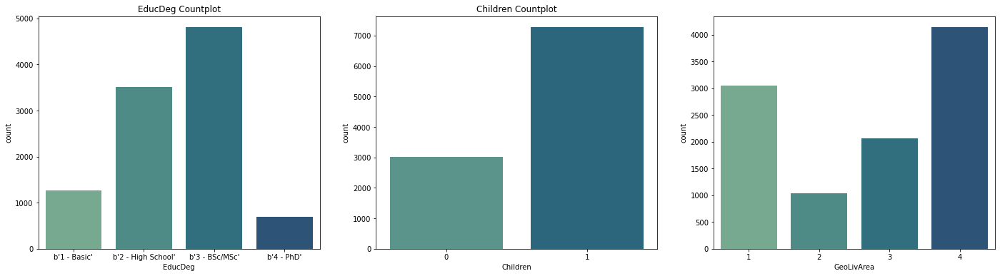

In [25]:
fig, ax = plt.subplots(1,3, figsize=(24,6))
ax[0].title.set_text('EducDeg Countplot')
ax[1].title.set_text('Children Countplot')
sns.countplot(data=df, x="EducDeg", ax=ax[0], palette='crest', order=df.EducDeg.value_counts().index.sort_values(), dodge=False)
sns.countplot(data=df, x="Children", ax=ax[1], palette='crest',  dodge=False)
sns.countplot(data=df, x="GeoLivArea", ax=ax[2], palette='crest',  dodge=False)


In [26]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
FirstPolYear,10293.0,NaN,NaN,NaN,1991.049062,510.596931,1974.0,1980.0,1986.0,1992.0,53784.0
EducDeg,10293,4,b'3 - BSc/MSc',4808,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10293.0,NaN,NaN,NaN,2506.40921,1156.183192,333.0,1706.0,2501.0,3290.0,55215.0
GeoLivArea,10293.0,NaN,NaN,NaN,2.709414,1.266241,1.0,1.0,3.0,4.0,4.0
Children,10293.0,NaN,NaN,NaN,0.706597,0.455344,0.0,0.0,1.0,1.0,1.0
CustMonVal,10293.0,NaN,NaN,NaN,177.929963,1946.091554,-165680.42,-9.44,187.03,399.86,11875.89
ClaimsRate,10293.0,NaN,NaN,NaN,0.742728,2.917385,0.0,0.39,0.72,0.98,256.2
PremMotor,10293.0,NaN,NaN,NaN,300.702459,211.67798,-4.11,191.26,299.28,408.3,11604.42
PremHousehold,10293.0,NaN,NaN,NaN,210.419863,352.635041,-75.0,49.45,132.8,290.05,25048.8
PremHealth,10293.0,NaN,NaN,NaN,171.596339,295.845039,-2.11,111.91,162.92,219.04,28272.0


### Analysis before outliers

In [27]:
def box_plot_all_vars(data):
    # All Numeric Variables' Box Plots in one figure
    sns.set()

    # Prepare figure. Create individual axes where each box plot will be placed
    fig, axes = plt.subplots(4, ceil(len(metric_features) / 4), figsize=(25, 20))

    # Plot data
    # Iterate across axes objects and associate each box plot (hint: use the ax argument):
    for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
        bxplot = sns.boxplot(x=data[feat], ax=ax, color='chartreuse', fliersize=8)
        bxplot.set_xlabel(fontsize=16, xlabel=feat)

    
        
    # Layout
    # Add a centered title to the figure:
    title = "Numeric Variables' Box Plots"

    plt.suptitle(title, size=30)

    plt.show()

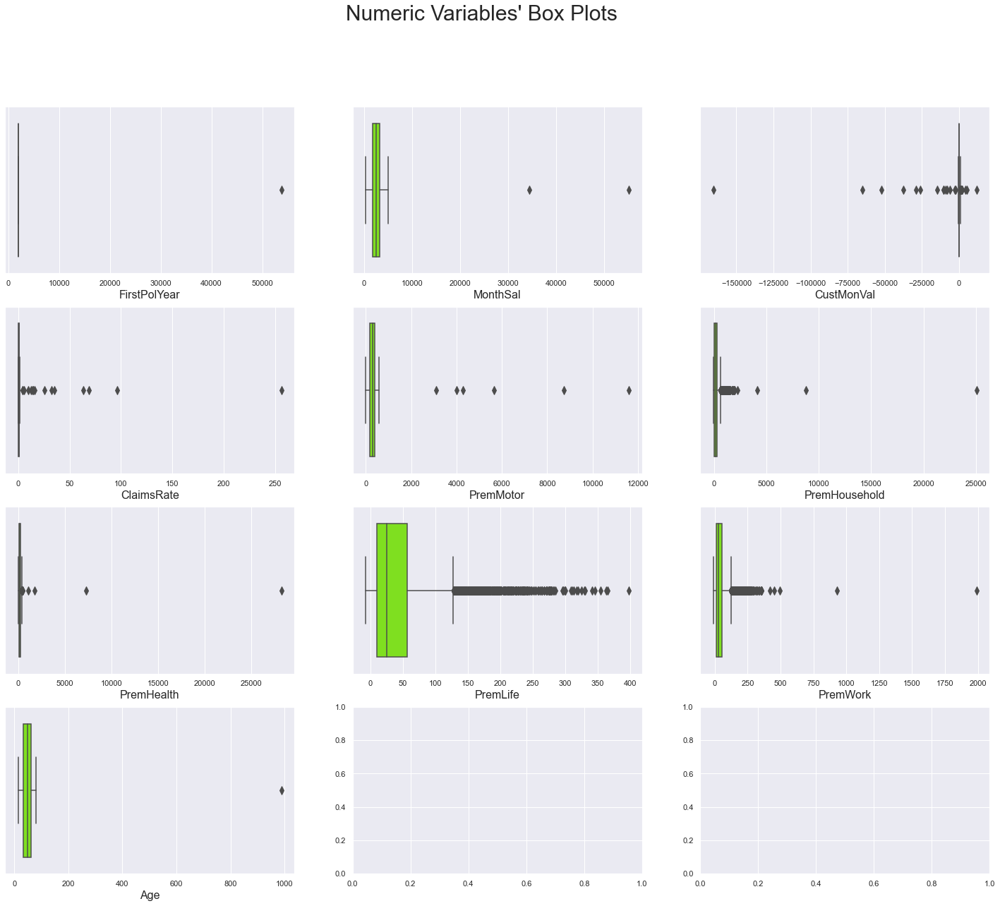

In [28]:
box_plot_all_vars(df)

### Observation method


In [29]:
##Following quartiles
filters1 = (
    (df['FirstPolYear']<=2016)
    &
    (df['MonthSal']<=5500)
    &
    (df['CustMonVal']>=-3000)
    &
    (df['CustMonVal']<=3000)
    &
    (df['ClaimsRate']<=6)
    &
    (df['PremMotor']<=700)
    &
    (df['PremHousehold']<=1500)
    &
    (df['PremHealth']<=760)
    &
    (df['PremLife']<=150)
    &
    (df['Age']<=85)
)

df_1 = df[filters1]
print('Percentage of data kept after removing outliers:', np.round(df_1.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.9553


In [30]:
# df_3['FirstPolYear'].unique()

### IQR method


In [31]:
##IQR method
q25 = df.quantile(.25)
q75 = df.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(df[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
df_2=df.copy()
df_2['filters2'] = filters2.to_list()
df_2=df_2[df_2['filters2']!=False]
print('Percentage of data kept after removing outliers:', np.round(df_2.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.8541


### Combining Both

In [32]:
##Combining the 2 above
df_3 = df.copy()
df_3['filters1'] = filters1.to_list()
df_3['filters2'] = filters2
df_3 = df_3[(df_3['filters1']==True) | (df_3['filters2']==True)]
print('Percentage of data kept after removing outliers:', np.round(df_3.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.9947


### Observation method more conservative

In [33]:
##Removing more critical data points
filters3 = (
    (df['FirstPolYear']<=2016)
    &
    (df['MonthSal']<=30000)
    &
    (df['CustMonVal']>=-75000)
    &
    (df['ClaimsRate']<=100)
    &
    (df['PremMotor']<=6000)
    &
    (df['PremHousehold']<=5000)
    &
    (df['PremHealth']<=5000)
    &
    (df['PremLife']<=398)
    &
    (df['Age']<=85)
)

df_4 = df[filters3]
print('Percentage of data kept after removing outliers:', np.round(df_4.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.9988


In [34]:
## print para comparar os dois metodos de outliers, e colocar que se escolheu so usar o manual
df_3.drop(columns=['filters1','filters2'], inplace=True)
print('Data shape before outliers removal:')
print(df.shape)
print('Data shape after outliers removal:')
print('df_1: ', df_1.shape)
print('df_2: ', df_2.shape)
print('df_3: ', df_3.shape)
print('df_4: ', df_4.shape)

Data shape before outliers removal:
(10293, 13)
Data shape after outliers removal:
df_1:  (9833, 13)
df_2:  (8791, 14)
df_3:  (10238, 13)
df_4:  (10281, 13)


In [87]:
df=df_1.copy()

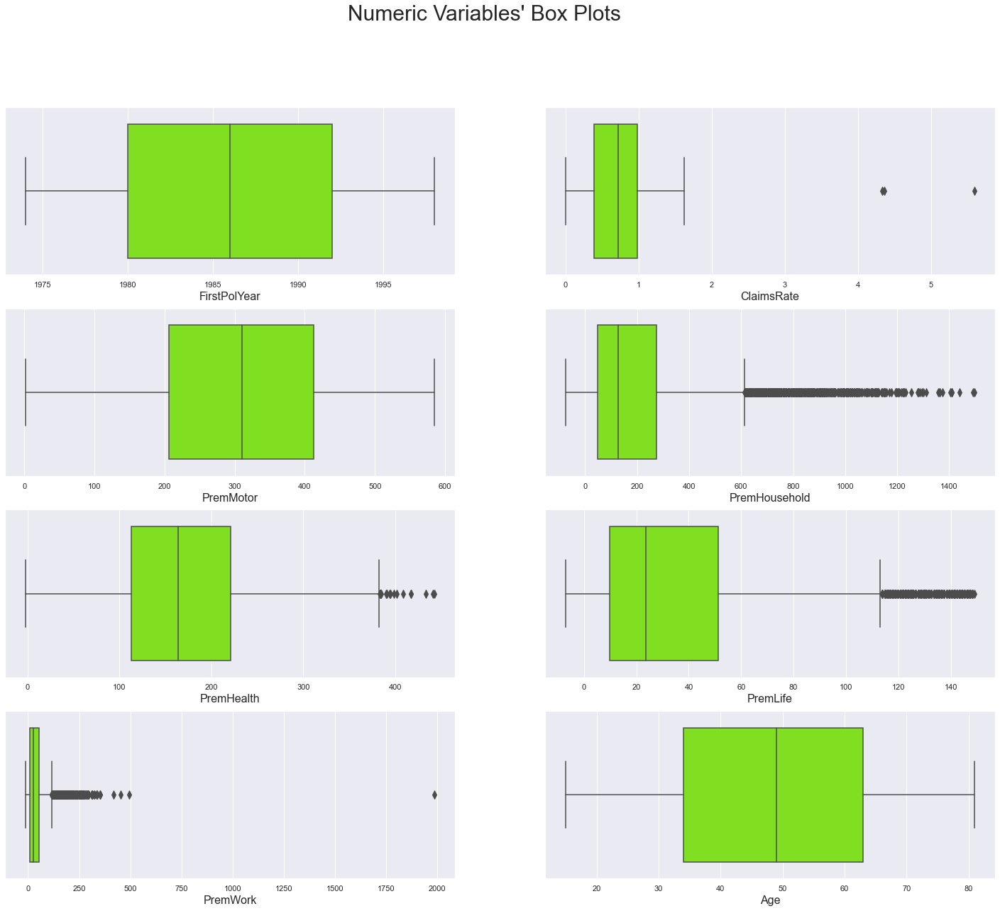

In [88]:
box_plot_all_vars(df)

In [89]:
df['FirstPolYear'].unique()

array([1985, 1991, 1990, 1986, 1979, 1988, 1981, 1976, 1983, 1977, 1998,
       1974, 1978, 1995, 1980, 1984, 1989, 1987, 1982, 1994, 1993, 1992,
       1997, 1996, 1975])

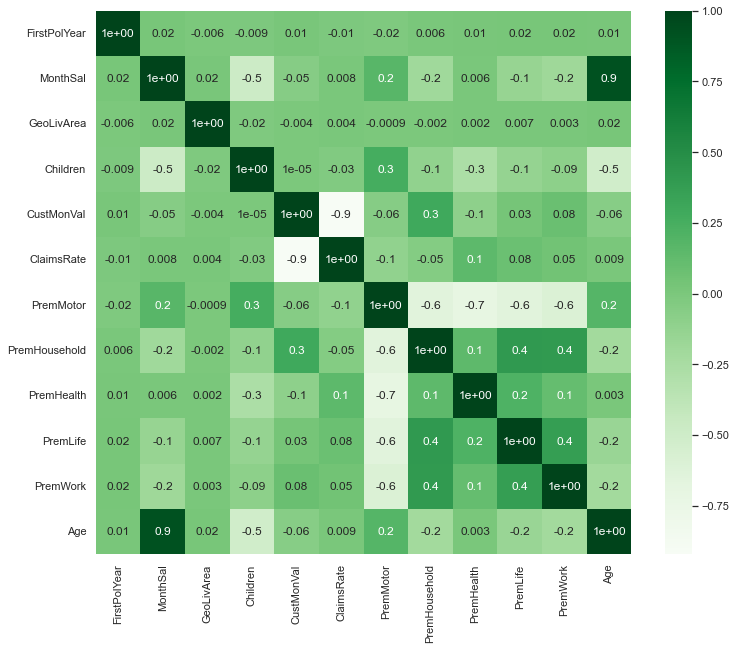

In [90]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Greens, fmt='.1')
    plt.show()
cor_pearson = df.corr()
cor_heatmap(cor_pearson)


In [39]:
##Drop columns with very high correlations
df.drop(columns=['MonthSal','CustMonVal'], inplace=True)
metric_features.remove('MonthSal')
metric_features.remove('CustMonVal')

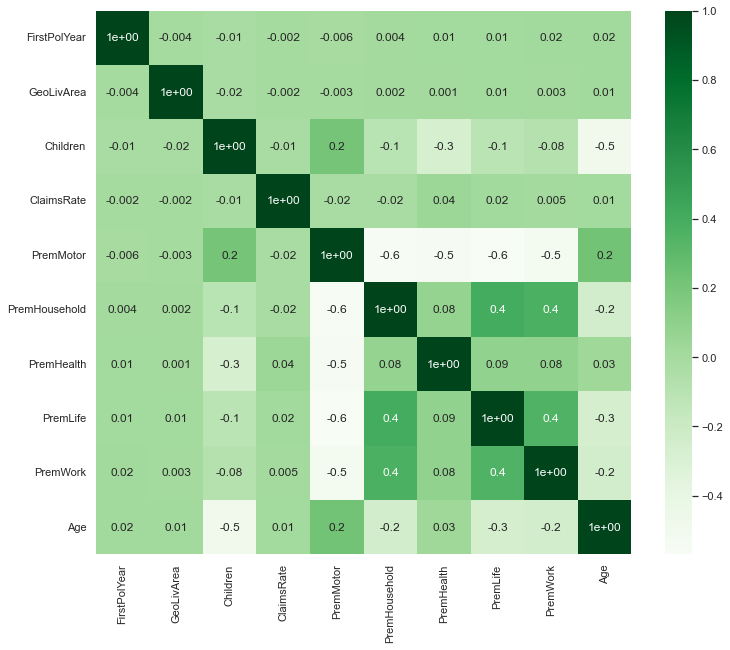

In [40]:
cor_pearson = df.corr()
cor_heatmap(cor_pearson)

In [92]:
df[metric_features].sample(5)

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age
CustID,,,,,,,,
3012,1981,0.26,415.41,99.45,108.91,22.56,32.23,63
9979,1975,1.05,481.98,-45.55,74.68,14.67,18.78,48
2061,1979,0.69,243.60,206.70,279.83,7.89,35.34,29
67,1984,1.00,366.07,78.35,165.81,16.56,7.89,48
8710,1977,0.90,126.69,-35.55,307.28,4.89,133.36,65


### MinMaxScaler

In [93]:
df_minmax=df.copy()
#normalize with minmaxscaler
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(df_minmax[metric_features])
df_minmax[metric_features] = scaled_features

df_minmax.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,9833.0,0.500970,0.274516,0.00,0.250000,0.500000,0.750000,1.00
MonthSal,9833.0,2540.409234,961.130835,333.00,1775.000000,2544.000000,3304.000000,5021.00
GeoLivArea,9833.0,2.706193,1.265996,1.00,1.000000,3.000000,4.000000,4.00
Children,9833.0,0.709753,0.453899,0.00,0.000000,1.000000,1.000000,1.00
CustMonVal,9833.0,215.943510,253.559653,-2642.91,-9.100000,187.380000,398.080000,2314.21
ClaimsRate,9833.0,0.121275,0.058205,0.00,0.069643,0.128571,0.175000,1.00
PremMotor,9833.0,0.522639,0.227486,0.00,0.350285,0.528383,0.703620,1.00
PremHousehold,9833.0,0.171569,0.140285,0.00,0.078415,0.128922,0.222180,1.00
PremHealth,9833.0,0.385104,0.167508,0.00,0.258489,0.373126,0.501000,1.00
PremLife,9833.0,0.268270,0.218464,0.00,0.107468,0.196426,0.372230,1.00


### StandartScaler

In [94]:
df_st_scaler=df.copy()
#normalize with standart scaler
from sklearn.preprocessing import StandardScaler
standart_scaler = StandardScaler()
standart_scaler_features = standart_scaler.fit_transform(df_st_scaler[metric_features])
df_st_scaler[metric_features] = standart_scaler_features

df_st_scaler.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,9833.0,2.392371e-15,1.000051,-1.825015,-0.914275,-0.003535,0.907205,1.817945
MonthSal,9833.0,2.540409e+03,961.130835,333.000000,1775.000000,2544.000000,3304.000000,5021.000000
GeoLivArea,9833.0,2.706193e+00,1.265996,1.000000,1.000000,3.000000,4.000000,4.000000
Children,9833.0,7.097529e-01,0.453899,0.000000,0.000000,1.000000,1.000000,1.000000
CustMonVal,9833.0,2.159435e+02,253.559653,-2642.910000,-9.100000,187.380000,398.080000,2314.210000
ClaimsRate,9833.0,6.300259e-17,1.000051,-2.083683,-0.887115,0.125365,0.923076,15.097795
PremMotor,9833.0,1.510820e-16,1.000051,-2.297576,-0.757687,0.025255,0.795613,2.098532
PremHousehold,9833.0,-2.806889e-17,1.000051,-1.223062,-0.664069,-0.304019,0.360791,5.905637
PremHealth,9833.0,1.328587e-16,1.000051,-2.299134,-0.755911,-0.071510,0.691917,3.671028
PremLife,9833.0,3.177227e-16,1.000051,-1.228041,-0.736093,-0.328873,0.475893,3.349596


### Robust Scaler

In [95]:
df_robust_scaler=df.copy()
#normalize with robust scaler
from sklearn.preprocessing import RobustScaler
robust_scaler = RobustScaler()
robust_scaler_features = robust_scaler.fit_transform(df_robust_scaler[metric_features])
df_robust_scaler[metric_features] = robust_scaler_features

df_robust_scaler.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,9833.0,0.001941,0.549032,-1.000000,-0.500000,0.00,0.500000,1.000000
MonthSal,9833.0,2540.409234,961.130835,333.000000,1775.000000,2544.00,3304.000000,5021.000000
GeoLivArea,9833.0,2.706193,1.265996,1.000000,1.000000,3.00,4.000000,4.000000
Children,9833.0,0.709753,0.453899,0.000000,0.000000,1.00,1.000000,1.000000
CustMonVal,9833.0,215.943510,253.559653,-2642.910000,-9.100000,187.38,398.080000,2314.210000
ClaimsRate,9833.0,-0.069255,0.552456,-1.220339,-0.559322,0.00,0.440678,8.271186
PremMotor,9833.0,-0.016259,0.643823,-1.495416,-0.504050,0.00,0.495950,1.334756
PremHousehold,9833.0,0.296645,0.975793,-0.896750,-0.351315,0.00,0.648685,6.059032
PremHealth,9833.0,0.049391,0.690725,-1.538597,-0.472709,0.00,0.527291,2.584932
PremLife,9833.0,0.271350,0.825134,-0.741896,-0.335994,0.00,0.664006,3.035075


### Choosing scaler method

In [96]:
df=df_st_scaler.copy()
# df=df_minmax.copy()

In [97]:
df.isna().sum()

FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
Age              0
dtype: int64

In [98]:
df[non_metric_features]

,EducDeg,Children,GeoLivArea
CustID,,,
1,b'2 - High School',1,1
3,b'1 - Basic',0,3
4,b'3 - BSc/MSc',1,4
5,b'3 - BSc/MSc',1,4
6,b'2 - High School',1,4
...,...,...,...
10292,b'4 - PhD',0,2
10293,b'1 - Basic',0,3
10294,b'3 - BSc/MSc',1,1


### One Hot Encoder
#### Using standart scaled DF

In [99]:
##ONE HOT ENCODING
df_ohc = df[non_metric_features].copy()

ohc = OneHotEncoder(sparse=False)
ohc_feat = ohc.fit_transform(df_ohc)
ohc_feat_names = ohc.get_feature_names_out()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
ohc_df.drop(['Children_0'],axis=1, inplace=True)
ohc_df

,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,
1,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
6,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...
10292,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10293,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10294,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


In [100]:
df_scaled=df.merge(ohc_df, on = 'CustID')
df_scaled.drop(['Children', 'EducDeg', 'GeoLivArea'],axis=1, inplace=True)
df_scaled

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,,,,,,,,,,,
1,-0.155325,2177,380.97,-0.887115,0.520969,-0.523131,-0.307112,0.355398,-0.454423,-0.869107,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,0.755415,2277,504.67,-1.224609,-0.757687,0.134203,-0.599335,1.508749,1.210930,-0.159774,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.603625,1099,-16.99,0.953757,-0.936036,-0.686727,1.904143,0.013263,-0.222251,-0.809996,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,-0.003535,1763,35.23,0.677626,0.240449,-0.666561,0.178985,-0.472235,0.043581,-0.337107,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
6,-0.003535,2566,-24.33,0.984438,1.009978,-0.797529,-0.730553,-0.817596,-0.641377,0.667782,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,-0.307115,3188,-0.11,0.861714,0.655767,-0.659084,0.061184,-0.736093,-0.497207,1.081560,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10293,-1.369645,2431,1405.60,-2.083683,-1.304488,3.810600,-0.348839,-0.644916,1.334822,0.904227,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10294,1.210785,2918,524.10,-1.439377,0.730286,-0.281361,-0.362256,-0.651366,-0.697747,-0.514441,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


#### Using MinMaxScaler

In [101]:
##ONE HOT ENCODING
df_ohc = df_minmax[non_metric_features].copy()

ohc = OneHotEncoder(sparse=False)
ohc_feat = ohc.fit_transform(df_ohc)
ohc_feat_names = ohc.get_feature_names_out()
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
ohc_df.drop(['Children_0'],axis=1, inplace=True)
ohc_df

,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,
1,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
6,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...
10292,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10293,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10294,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


In [102]:
df_minmax=df_minmax.merge(ohc_df, on = 'CustID')
df_minmax.drop(['Children', 'EducDeg', 'GeoLivArea'],axis=1, inplace=True)
df_minmax

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,,,,,,,,,,,
1,0.458333,2177,380.97,0.069643,0.641146,0.098185,0.333663,0.345908,0.014440,0.287879,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,0.708333,2277,504.67,0.050000,0.350285,0.190394,0.284716,0.597861,0.055491,0.469697,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.666667,1099,-16.99,0.176786,0.309715,0.075236,0.704047,0.271167,0.020163,0.303030,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,0.500000,1763,35.23,0.160714,0.577334,0.078065,0.415084,0.165108,0.026716,0.424242,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
6,0.500000,2566,-24.33,0.178571,0.752382,0.059693,0.262737,0.089663,0.009832,0.681818,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,0.416667,3188,-0.11,0.171429,0.671809,0.079114,0.395352,0.107468,0.013385,0.787879,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10293,0.125000,2431,1405.60,0.000000,0.225902,0.706112,0.326674,0.127386,0.058545,0.742424,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10294,0.833333,2918,524.10,0.037500,0.688760,0.132100,0.324426,0.125977,0.008442,0.378788,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


### Keep one hot from standart scaler

In [185]:
df=df_scaled.copy()

In [54]:
ProfileReport(
    df,
    title='Data Preprocessed Analysis',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## PCA
#### Using standart scaler df

In [55]:
# ##PCA
# df_pca = df.copy()


# pca = PCA()
# pca_feat = pca.fit_transform(df_pca[metric_features])

In [56]:
# pd.DataFrame(
#     {"Eigenvalue": pca.explained_variance_,
#      "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
#      "Proportion": pca.explained_variance_ratio_,
#      "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
#     index=range(1, pca.n_components_ + 1)
# )

##### We can notice that only a reduction to 5 components (~82%) would be representative of the data set. Since originally, we had 13 features, it doesn't make sense to keep 5 components.
#### Let's try with the df from min max scaler...


In [57]:
# ##PCA
# df_pca_min_max = df_minmax.copy()


# pca_min_max = PCA()
# pca_feat_min_max = pca_min_max.fit_transform(df_pca_min_max[metric_features])

In [58]:
# pd.DataFrame(
#     {"Eigenvalue": pca_min_max.explained_variance_,
#      "Difference": np.insert(np.diff(pca_min_max.explained_variance_), 0, 0),
#      "Proportion": pca_min_max.explained_variance_ratio_,
#      "Cumulative": np.cumsum(pca_min_max.explained_variance_ratio_)},
#     index=range(1, pca_min_max.n_components_ + 1)
# )

##### Now it's clear that with only 3 components, we have 90% of explained variance
##### Let's keep this DF to visualize PCA

In [59]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))


# ax1.plot(pca_min_max.explained_variance_, marker=".", markersize=12)
# ax2.plot(pca_min_max.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
# ax2.plot(np.cumsum(pca_min_max.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")


# ax2.legend()
# ax1.set_title("Scree Plot", fontsize=14)
# ax2.set_title("Variance Explained", fontsize=14)
# ax1.set_ylabel("Eigenvalue")
# ax2.set_ylabel("Proportion")
# ax1.set_xlabel("Components")
# ax2.set_xlabel("Components")
# ax1.set_xticks(range(0, pca_min_max.n_components_, 2))
# ax1.set_xticklabels(range(1, pca_min_max.n_components_ + 1, 2))
# ax2.set_xticks(range(0, pca_min_max.n_components_, 2))
# ax2.set_xticklabels(range(1, pca_min_max.n_components_ + 1, 2))

# plt.show()

In [60]:
# pca_min_max = PCA(n_components=3)
# pca_feat_min_max = pca_min_max.fit_transform(df_pca_min_max[metric_features])
# pca_feat_names = [f"PC{i}" for i in range(pca_min_max.n_components_)]
# pca_df = pd.DataFrame(pca_feat_min_max, index=df_pca_min_max.index, columns=pca_feat_names) 
# pca_df

In [61]:
# df_pca_min_max = pd.concat([df_pca_min_max, pca_df], axis=1)
# df_pca_min_max.head()

In [62]:
# def _color_red_or_green(val):
#     if val < -0.45:
#         color = 'background-color: red'
#     elif val > 0.45:
#         color = 'background-color: green'
#     else:
#         color = ''
#     return color
    


# # Interpreting each Principal Component
# loadings = df_pca_min_max[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
# loadings.style.applymap(_color_red_or_green)

In [63]:
# df_pca_min_max['HighScore'] = df_pca_min_max[['PC0', 'PC1', 'PC2']].idxmax(axis=1)
# df_pca_min_max

### At this point, we have 2 different Dataframes. One from min max scaler with 3 Principal components. And another from standart scaler without PCA.
#### Let's see wich one performs best when doing clustering

In [64]:
# df_pca_min_max.head()

In [65]:
# df = df_pca.copy()
# df.head()

# NEW

### DBSCAN

In [142]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [145]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(df[metric_features], quantile=0.1, random_state=1, n_jobs=-1)
bandwidth

2.3852529349700617

In [146]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df[metric_features])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 8


In [147]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(ms_labels, index=df.index, name="ms_labels")], axis=1)
df_concat.head()

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,ms_labels
CustID,,,,,,,,,
1,-0.155325,-0.887115,0.520969,-0.523131,-0.307112,0.355398,-0.454423,-0.869107,0
3,0.755415,-1.224609,-0.757687,0.134203,-0.599335,1.508749,1.210930,-0.159774,0
4,0.603625,0.953757,-0.936036,-0.686727,1.904143,0.013263,-0.222251,-0.809996,0
5,-0.003535,0.677626,0.240449,-0.666561,0.178985,-0.472235,0.043581,-0.337107,0
6,-0.003535,0.984438,1.009978,-0.797529,-0.730553,-0.817596,-0.641377,0.667782,0


In [148]:
df_concat['ms_labels'].value_counts()


0    9327
2     271
1     195
4      30
6       6
5       2
3       1
7       1
Name: ms_labels, dtype: int64

In [149]:
# Computing the R^2 of the cluster solution
sst = get_ss(df[metric_features])  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1527


#### DBSCAN with mean shift return 8 bad clusters

---

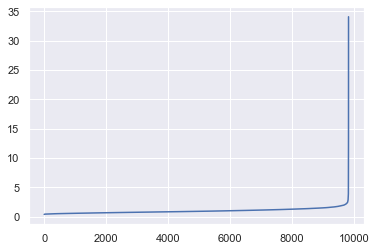

In [154]:
from sklearn.neighbors import NearestNeighbors
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=10)
neigh.fit(df[metric_features])
distances, _ = neigh.kneighbors(df[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [183]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.8, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [184]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(dbscan_labels, index=df.index, name="dbscan_labels")], axis=1)
df_concat['dbscan_labels'].value_counts()

 0    9742
-1       6
Name: dbscan_labels, dtype: int64

#### This one is not good too

---
### Gaussian

In [157]:
from sklearn.mixture import GaussianMixture
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df[metric_features])
labels_proba = gmm.predict_proba(df[metric_features])

In [158]:
# The estimated covariance matrices of the Components
gmm.covariances_.shape

(4, 8, 8)

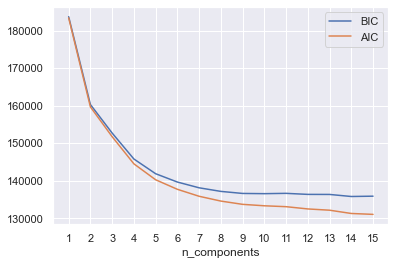

In [115]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df[metric_features])
          for n in n_components]

bic_values = [m.bic(df[metric_features]) for m in models]
aic_values = [m.aic(df[metric_features]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [160]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df[metric_features])

In [161]:
# Concatenating the labels to df
df_concat = pd.concat([df[metric_features], pd.Series(gmm_labels, index=df.index, name="gmm_labels")], axis=1)
df_concat.head()

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,gmm_labels
CustID,,,,,,,,,
1,-0.155325,-0.887115,0.520969,-0.523131,-0.307112,0.355398,-0.454423,-0.869107,0
3,0.755415,-1.224609,-0.757687,0.134203,-0.599335,1.508749,1.210930,-0.159774,1
4,0.603625,0.953757,-0.936036,-0.686727,1.904143,0.013263,-0.222251,-0.809996,3
5,-0.003535,0.677626,0.240449,-0.666561,0.178985,-0.472235,0.043581,-0.337107,3
6,-0.003535,0.984438,1.009978,-0.797529,-0.730553,-0.817596,-0.641377,0.667782,3


In [162]:
# Computing the R^2 of the cluster solution
sst = get_ss(df[metric_features])  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3331


In [163]:
df_concat['gmm_labels'].value_counts()

1    4775
3    2230
0    2189
2     639
Name: gmm_labels, dtype: int64

In [164]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

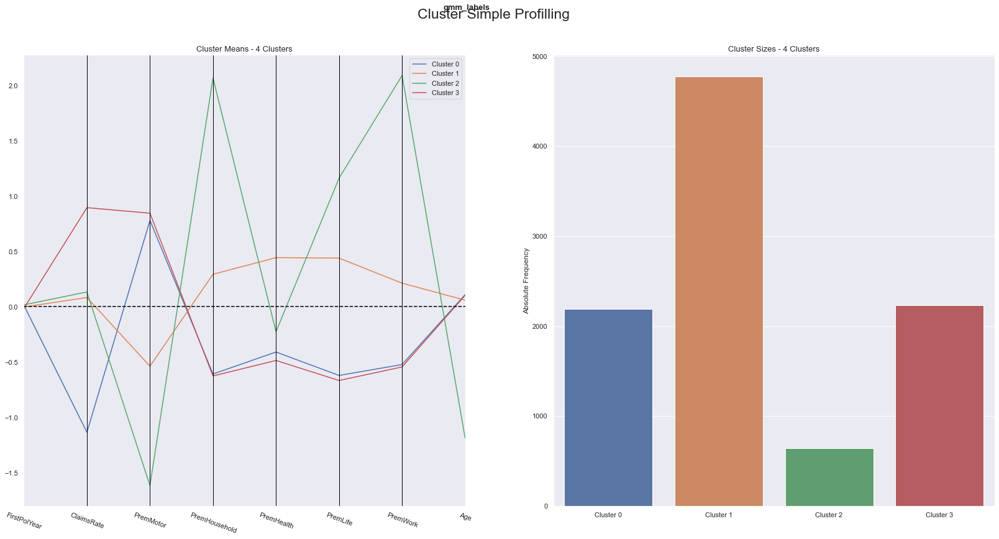

In [165]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_concat[metric_features + ['gmm_labels']], 
    label_columns = ['gmm_labels'], 
    figsize = (28, 13), 
    compar_titles = ["gmm_labels"]
)

In [177]:
from sklearn.manifold import TSNE
# This is step can be quite time consuming
two_dim = TSNE(random_state=42).fit_transform(df_concat[metric_features])

c:\Users\henri\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Users\henri\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


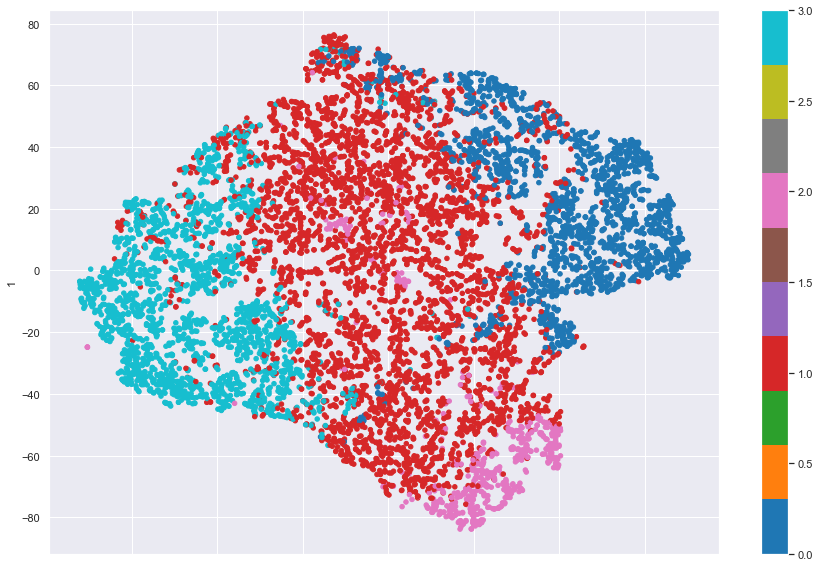

In [178]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df_concat['gmm_labels'], colormap='tab10', figsize=(15,10))
plt.show()

---
### Splitting variables perspectives

In [194]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df[metric_features])
Counter(dbscan_labels)

Counter({0: 9748, -1: 85})

In [195]:
# Save the newly detected outliers (they will be classified later based on the final clusters)
df_out = df[dbscan_labels==-1].copy()

# New df without outliers and 'rcn'
df = df[dbscan_labels!=-1]\
    .copy()


In [196]:
df

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,,,,,,,,,,,
1,-0.155325,2177,380.97,-0.887115,0.520969,-0.523131,-0.307112,0.355398,-0.454423,-0.869107,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
3,0.755415,2277,504.67,-1.224609,-0.757687,0.134203,-0.599335,1.508749,1.210930,-0.159774,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.603625,1099,-16.99,0.953757,-0.936036,-0.686727,1.904143,0.013263,-0.222251,-0.809996,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,-0.003535,1763,35.23,0.677626,0.240449,-0.666561,0.178985,-0.472235,0.043581,-0.337107,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
6,-0.003535,2566,-24.33,0.984438,1.009978,-0.797529,-0.730553,-0.817596,-0.641377,0.667782,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,1.210785,626,176.26,0.524220,-2.259073,3.097980,-0.887129,2.290648,3.284053,-1.873997,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
10292,-0.307115,3188,-0.11,0.861714,0.655767,-0.659084,0.061184,-0.736093,-0.497207,1.081560,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10294,1.210785,2918,524.10,-1.439377,0.730286,-0.281361,-0.362256,-0.651366,-0.697747,-0.514441,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


In [187]:
metric_features

['FirstPolYear',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'Age']

In [201]:
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df[metric_features].values, 
    mapsize=[10, 10],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.004000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.152000, quantization error: 2.675692

 epoch: 2 ---> elapsed time:  0.063000, quantization error: 2.637306

 epoch: 3 ---> elapsed time:  0.055000, quantization error: 2.568238

 epoch: 4 ---> elapsed time:  0.066000, quantization error: 2.530839

 epoch: 5 ---> elapsed time:  0.073000, quantization error: 2.496604

 epoch: 6 ---> elapsed time:  0.056000, quantization error: 2.484114

 epoch: 7 ---> elapsed time:  0.075000, quantization error: 2.475976

 epoch: 8 ---> elapsed time:  0.076000, quantization error: 2.469953

 epoch: 9 ---> elapsed time:  0.059000, quantization error: 2.466664

 epoch: 10 ---> elapsed time:  0.053000, quantization error: 2.463715

 epoch: 11 ---> elapsed time:  0.056000, quantization error: 2.460786

 epoch: 12 ---> elapsed time:  0.050000, quantization error: 2.457831

 epoch: 13 ---> 

In [203]:
plt.rcParams['figure.dpi'] = 72
weights = sm.codebook.matrix 

In [212]:
from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors

from matplotlib.lines import Line2D
from matplotlib import __version__ as mplver
###################################
### Visualizing Component Planes ##
###################################

def plot_component_planes(weights,
                          features,
                          M=3, N=4, 
                          figsize=(20,20),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    
    xx, yy = np.meshgrid(np.arange(M), np.arange(N))
    xx = xx.astype(float)
    yy = yy.astype(float)

    xx[::-2] -= 0.5

    xx = xx.T
    yy = yy.T
    
    weights_ = weights.reshape((M,N,len(features)))

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                         vmax=np.max(weights))

    for cpi, sf in zip(range(len(metric_features)), subfigs.flatten()):

        sf.suptitle(features[cpi], y=0.95)

        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')

        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))

        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), 
                                     numVertices=6, 
                                     radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                     alpha=1, 
                                     linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                    )
                axs.add_patch(hexagon)


        ## only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            ## Add colorbar
            divider = make_axes_locatable(axs)

            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

            ## Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])

            ## Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,
                                    orientation='vertical', 
                                    alpha=1,
                                    mappable=cmap_sm
                                    )
            cb1.ax.get_yaxis().labelpad = 16

            ## Add colorbar to plot
            sf.add_axes(ax_cb)



        ## Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")


    fig.suptitle(title)
    plt.show()

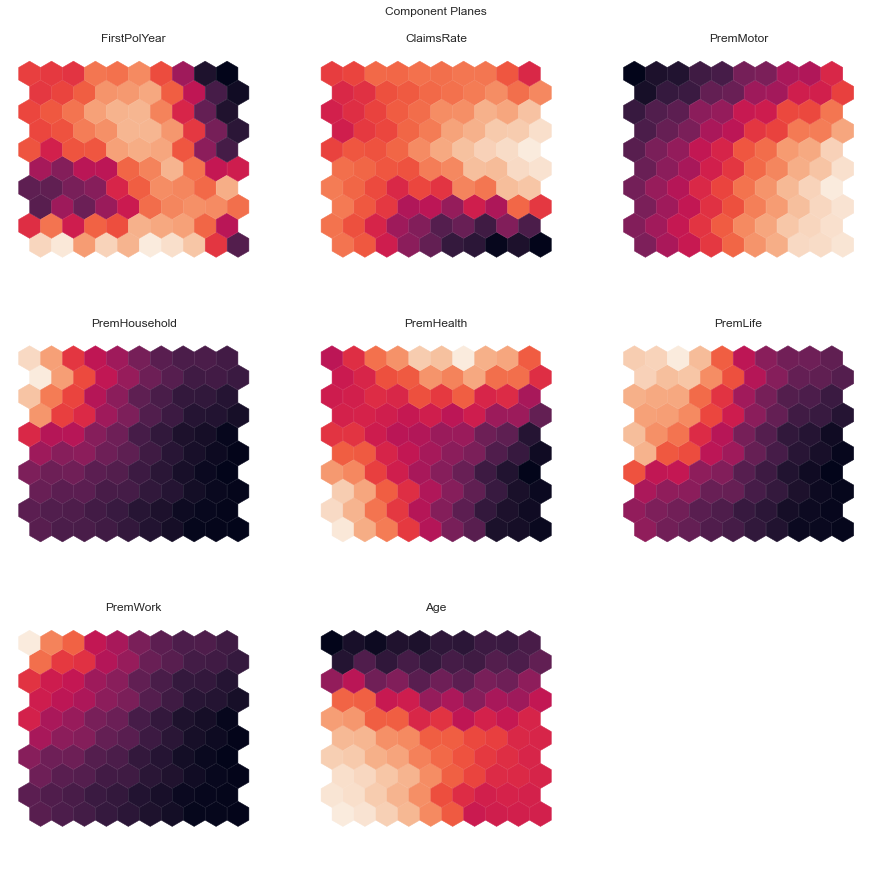

In [219]:
### Use this if cell below does not work ####

plot_component_planes(weights=sm.codebook.matrix,features=metric_features,
                     M=10,N=10,
                     figsize=(12,12),figlayout=(3,3),
                     title="Component Planes",
                     cmap=sns.color_palette("rocket", as_cmap=True))


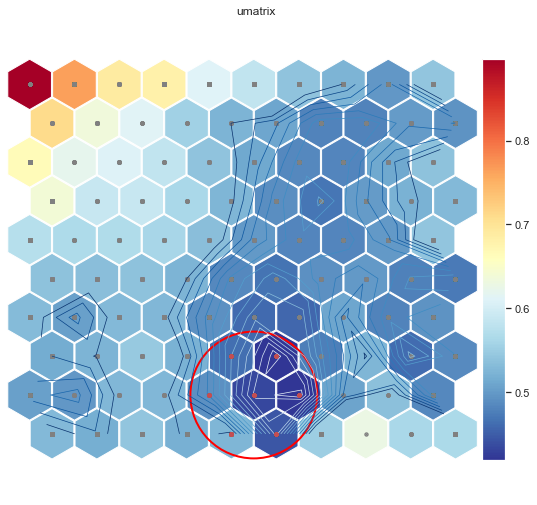

array([[0.89789803, 0.76375305, 0.68885158, 0.68076215, 0.61020133,
        0.58343151, 0.53880347, 0.52199088, 0.49668311, 0.54227463],
       [0.70926089, 0.63478658, 0.61282262, 0.55547683, 0.52241223,
        0.50903892, 0.47993837, 0.47942098, 0.49954211, 0.49234656],
       [0.66552293, 0.61976141, 0.6090091 , 0.58226999, 0.53973607,
        0.51234407, 0.48325966, 0.48164555, 0.51160668, 0.53727455],
       [0.63830621, 0.58850386, 0.58761287, 0.56230797, 0.52469517,
        0.48873058, 0.46937085, 0.49956063, 0.52169507, 0.52775015],
       [0.57334667, 0.56595353, 0.56684315, 0.56085162, 0.53392322,
        0.49806321, 0.48083173, 0.48137501, 0.49905719, 0.54071712],
       [0.53855983, 0.53326485, 0.53744513, 0.52297868, 0.48338297,
        0.46607527, 0.49028091, 0.49888991, 0.47741264, 0.47182328],
       [0.53067658, 0.50471242, 0.52933953, 0.52578644, 0.49012587,
        0.45900827, 0.45670039, 0.51067007, 0.48067449, 0.49265055],
       [0.51525482, 0.52330201, 0.5445543

In [220]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

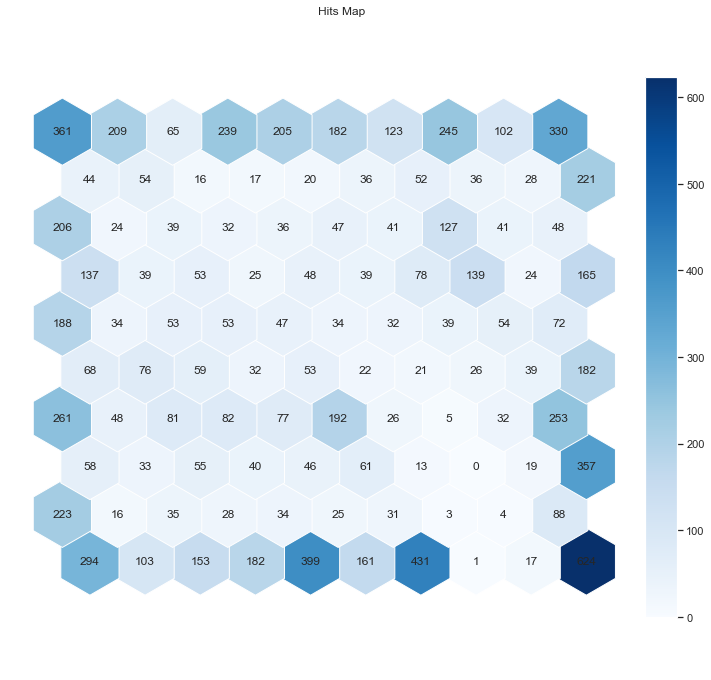

In [221]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

### Split variables into perspectives
#### - Remove geolivArea because almost doesn't have correlations with any other variable
#### - Remove FirstPolYear because the SOM's units were indistinguishable on this variable

In [222]:
#Split variables into perpectives

demographic=['Age', "EducDeg_b'1 - Basic'", "EducDeg_b'2 - High School'","EducDeg_b'3 - BSc/MSc'","EducDeg_b'4 - PhD'","Children_1"]

insurance=['ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork']
metric_features.remove('FirstPolYear')

df_demo=df[demographic].copy()
df_insurance=df[insurance].copy()

#### Clustering with SOM's

In [224]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
sm = sompy.SOMFactory().build(
    df[metric_features].values, 
    mapsize=[50, 50],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.014000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  2.394000, quantization error: 1.448573

 epoch: 2 ---> elapsed time:  3.201000, quantization error: 2.465847

 epoch: 3 ---> elapsed time:  2.198000, quantization error: 2.433323

 epoch: 4 ---> elapsed time:  1.611000, quantization error: 2.427909

 epoch: 5 ---> elapsed time:  1.064000, quantization error: 2.425195

 epoch: 6 ---> elapsed time:  0.938000, quantization error: 2.423437

 epoch: 7 ---> elapsed time:  0.877000, quantization error: 2.422027

 epoch: 8 ---> elapsed time:  0.783000, quantization error: 2.419876

 epoch: 9 ---> elapsed time:  0.709000, quantization error: 2.417892

 epoch: 10 ---> elapsed time:  0.828000, quantization error: 2.416646

 epoch: 11 ---> elapsed time:  1.027000, quantization error: 2.415473

 epoch: 12 ---> elapsed time:  1.010000, quantization error: 2.414278

 epoch: 13 --->

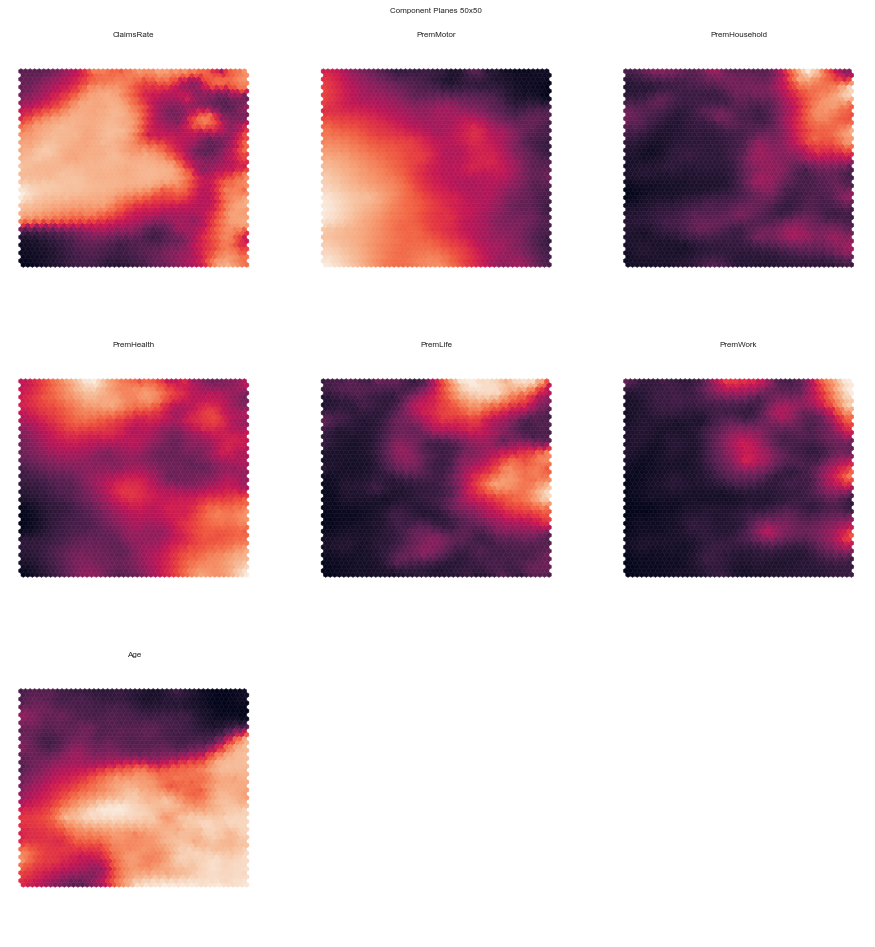

In [226]:
### Use this if cell below does not work

plot_component_planes(weights=sm.codebook.matrix,features=metric_features,
                     M=50,N=50,
                     figsize=(12,13),figlayout=(3,3),
                     title="Component Planes 50x50",
                     cmap=sns.color_palette("rocket", as_cmap=True))


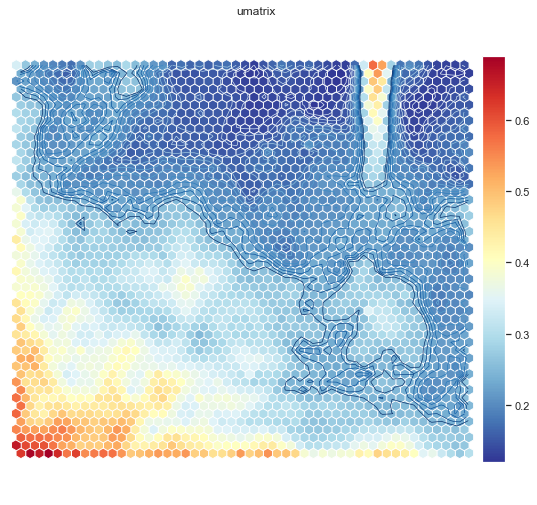

In [227]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

In [228]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution


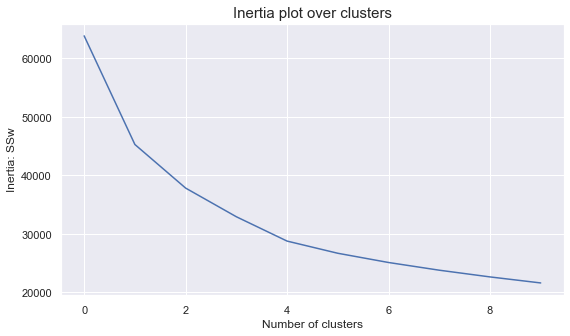

In [229]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

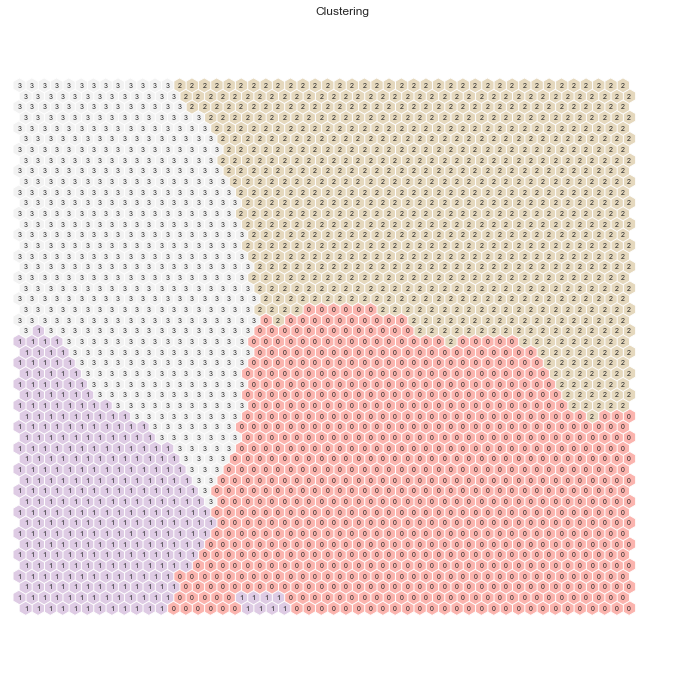

In [230]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [231]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,label
0,-1.807234,1.790179,-0.865020,-1.796532,-0.967896,-0.887048,0.041908,2
1,-1.747698,1.731632,-0.901974,-1.701540,-0.955198,-0.864826,0.092050,2
2,-1.711433,1.663190,-0.888339,-1.594529,-0.942066,-0.854992,0.145792,2
3,-1.683370,1.594322,-0.848070,-1.503763,-0.928220,-0.882585,0.222854,2
4,-1.681674,1.557082,-0.780181,-1.462040,-0.903652,-0.858830,0.346046,2
...,...,...,...,...,...,...,...,...
2495,0.524921,-1.844807,3.159439,-0.573742,0.311116,3.433743,-1.584102,1
2496,0.622392,-1.808585,2.478855,-0.498585,0.603591,3.702072,-1.574246,1
2497,0.721595,-1.748474,1.638393,-0.183907,0.730988,3.707984,-1.519455,1
2498,0.704060,-1.698902,0.955594,0.083230,0.781989,3.696788,-1.462468,1


In [232]:
df_nodes['label'].value_counts()

0    844
2    803
3    548
1    305
Name: label, dtype: int64

In [233]:
# Characterizing the final clusters
df_nodes.groupby('label').mean()

,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age
label,,,,,,,
0,0.033083,-0.416258,0.241099,0.345028,0.373692,0.164361,0.921655
1,-0.136024,-1.283658,1.522588,0.272245,1.196734,1.060577,-1.173065
2,0.090694,0.934223,-0.552227,-0.757465,-0.582361,-0.561028,0.221936
3,0.302676,-0.277094,-0.168495,0.611546,-0.037134,-0.014233,-0.866448


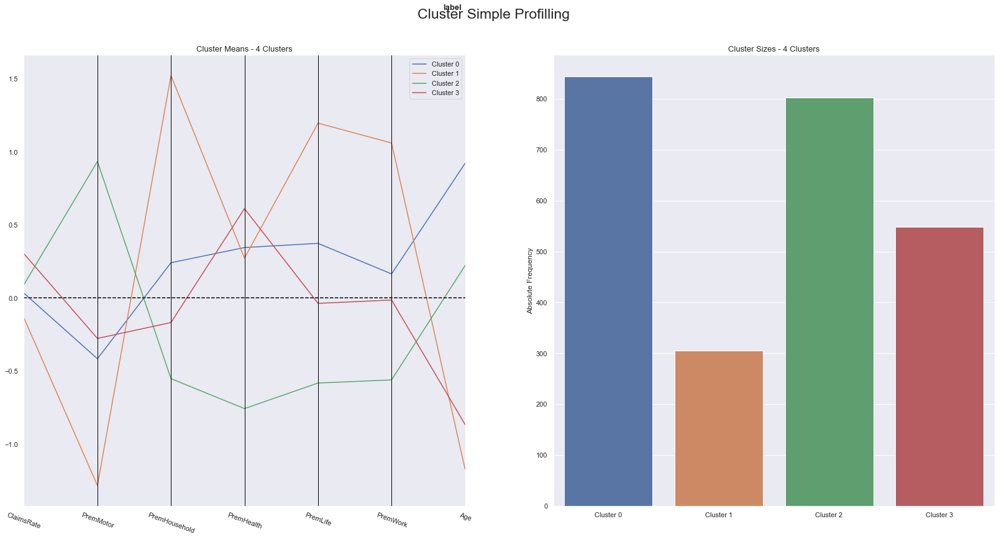

In [236]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_nodes[metric_features + ['label']], 
    label_columns = ['label'], 
    figsize = (28, 13), 
    compar_titles = ["label"]
)

In [235]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_nodes[metric_features])  # get total sum of squares
ssw_labels = df_nodes[metric_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.5341186016800716

#### R^2 = 0.534
----

#### Clustering with K-Means

In [198]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [199]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_demo, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_demo, hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.425065,0.358964,0.402967,0.052400,0.329289
3,0.542831,0.503601,0.451537,0.266497,0.486968
4,0.633571,0.583443,0.485767,0.357862,0.590573
5,0.695669,0.611868,0.503360,0.378167,0.652664
6,0.746717,0.695201,0.550919,0.509029,0.708215
7,0.789851,0.727047,0.659911,0.529555,0.757842
8,0.822726,0.757054,0.770878,0.615806,0.787403
9,0.849040,0.776406,0.781011,0.616185,0.816696


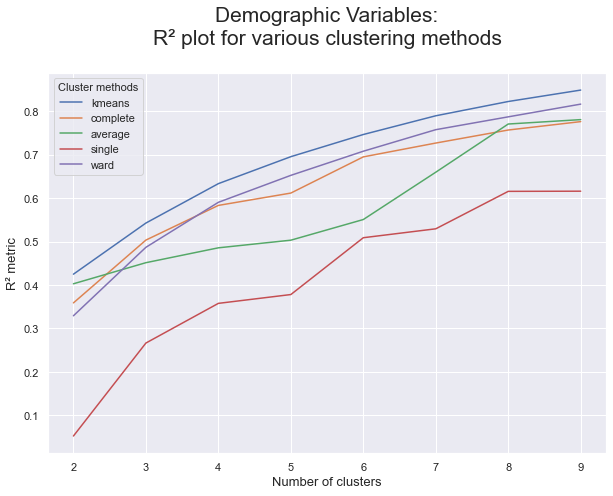

In [200]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()

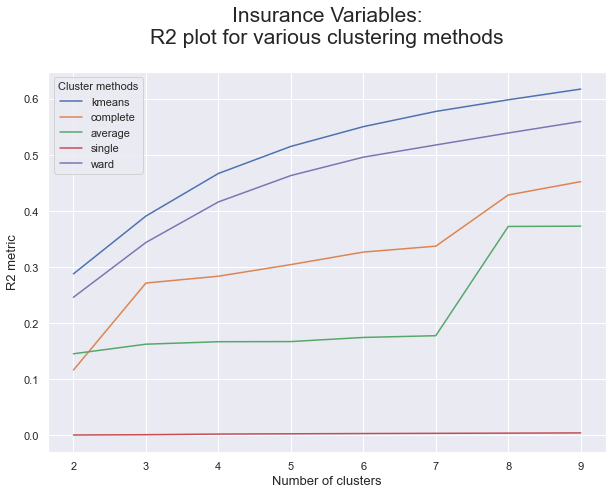

In [174]:
##now for insurance

# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_insurance, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_insurance, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Insurance Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

---

## Hierarchical Clustering

In [91]:
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(df[metric_features])
hc_labels



array([3, 2, 1, ..., 0, 4, 3], dtype=int64)

In [92]:
df_concat = pd.concat((df, pd.Series(hc_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
labels,,,,,,,,,,,,,,,,,
0.0,0.026538,-0.023321,-0.021343,-0.011386,0.023779,0.000208,0.009746,0.007487,0.130489,0.331361,0.472438,0.065712,0.698536,0.291498,0.094052,0.208346,0.406104
1.0,-0.029642,-0.030887,0.006406,-0.017757,-0.003586,-0.011127,-0.018098,-0.007679,0.112779,0.346718,0.472067,0.068436,0.712291,0.293645,0.105796,0.202863,0.397696
2.0,0.012673,-0.023785,-0.010724,0.020381,-0.040086,0.017720,0.021125,-0.052477,0.127784,0.361079,0.443142,0.067995,0.712778,0.302462,0.117233,0.202814,0.377491
3.0,-0.026007,-0.028974,0.010681,-0.001992,-0.013581,-0.017942,-0.036847,0.040674,0.122045,0.326097,0.483357,0.068500,0.703329,0.306319,0.101785,0.186204,0.405692
4.0,0.037534,-0.015034,-0.009660,-0.031434,0.028044,-0.006807,-0.018033,-0.011053,0.115052,0.367647,0.443772,0.073529,0.721453,0.288927,0.096021,0.194637,0.420415


In [93]:
# Computing SST
X = df[metric_features].values
sst = np.sum(np.square(X - X.mean(axis=0)), axis=0)

# Computing SSW
ssw_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssw_iter.append(np.sum(np.square(X_k - X_k.mean(axis=0)), axis=0))
ssw = np.sum(ssw_iter, axis=0)

# Computing SSB
ssb_iter = []
for i in np.unique(hc_labels):
    X_k = X[hc_labels == i]
    ssb_iter.append(X_k.shape[0] * np.square(X_k.mean(axis=0) - X.mean(axis=0)))
ssb = np.sum(ssb_iter, axis=0)

# Verifying the formula
np.round(sst) == np.round((ssw + ssb))

array([ True,  True,  True,  True,  True,  True,  True,  True])

In [94]:
df.columns

Index(['FirstPolYear', 'ClaimsRate', 'PremMotor', 'PremHousehold',
       'PremHealth', 'PremLife', 'PremWork', 'Age', 'EducDeg_b'1 - Basic'',
       'EducDeg_b'2 - High School'', 'EducDeg_b'3 - BSc/MSc'',
       'EducDeg_b'4 - PhD'', 'Children_1', 'GeoLivArea_1', 'GeoLivArea_2',
       'GeoLivArea_3', 'GeoLivArea_4'],
      dtype='object')

In [95]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(df) #get cluster labels
        
        
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

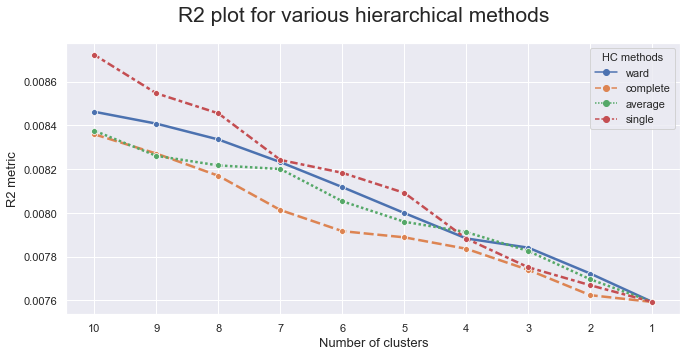

In [96]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df=df[metric_features], link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [97]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df[metric_features])

array([6285, 9477, 7459, ...,    2,    1,    0], dtype=int64)

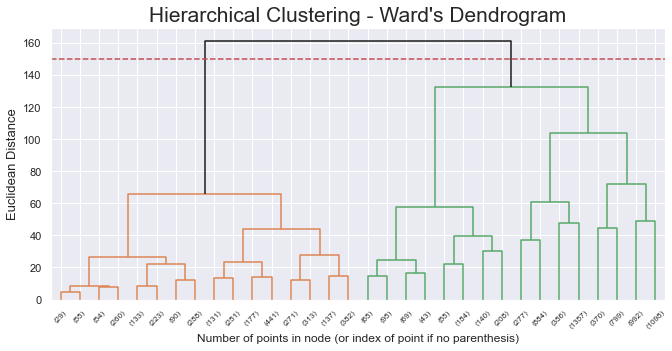

In [98]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))

# This threshold intercepts one of the dendrogram's largest lines
y_threshold = 150

dendrogram(linkage_matrix, truncate_mode='level', p=4, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [99]:
# 3 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc4lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=2)
hc4_labels = hc4lust.fit_predict(df[metric_features])

In [100]:
# Characterizing the 3 clusters
df_concat = pd.concat((df_pca, pd.Series(hc4_labels, name='labels')), axis=1)
df_concat_mean=df_concat.groupby('labels').mean()
df_concat_mean

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
labels,,,,,,,,,,,,,,,,,
0.0,-0.011656,0.006444,0.008237,-0.003988,-0.008498,-0.003178,-0.008568,-0.000771,0.119341,0.345415,0.466046,0.069198,0.710315,0.297708,0.104298,0.196848,0.401146
1.0,0.026968,-0.012968,-0.017255,0.007624,0.019416,0.004264,0.020105,0.003273,0.133086,0.330857,0.470752,0.065305,0.699474,0.291551,0.093779,0.208604,0.406066


In [101]:
                                            #### IT IS VERY DIFFICULT TO INTERPRET CLUSTERS WITH SO MANY DATA POINTS USING SCATTER PLOTS
# sns.scatterplot(x="PremLife",
#                     y="Age",
#                     data=df_concat,
#                     hue='labels')

In [102]:
#labels need to be present, so it can check wich cluster each row belongs
metric_features.append('labels')

df_concat_means = pd.concat([pd.DataFrame(df_concat[metric_features].mean().drop('labels'), columns=['mean']), 
                   df_concat[metric_features].groupby('labels').mean().T], axis=1)

df_concat_means.drop(columns=['mean'], inplace=True)
df_concat_means

,0.0,1.0
FirstPolYear,-0.011656,0.026968
ClaimsRate,0.006444,-0.012968
PremMotor,0.008237,-0.017255
PremHousehold,-0.003988,0.007624
PremHealth,-0.008498,0.019416
PremLife,-0.003178,0.004264
PremWork,-0.008568,0.020105
Age,-0.000771,0.003273


In [103]:
df_concat['labels'].value_counts()

0.0    6992
1.0    3235
Name: labels, dtype: int64

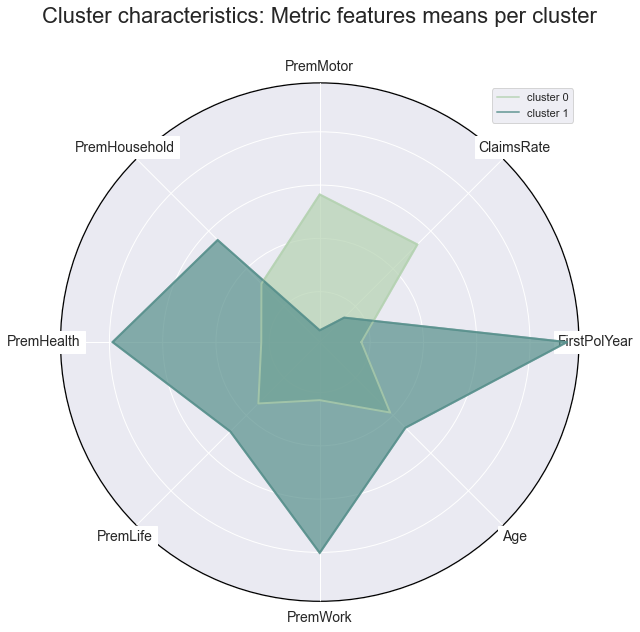

In [104]:
cluster_colors = ['#b4d2b1', '#568f8b', '#1d4a60', '#8B8378', '#FFEFDB', '#0000FF', '#A52A2A']

class Radar(object):
    def __init__(self, figure, title, labels, rect=None):
        if rect is None:
            rect = [0.05, 0.05, 0.9, 0.9]

        self.n = len(title)
        self.angles = np.arange(0, 360, 360.0/self.n)
        
        self.axes = [figure.add_axes(rect, projection='polar', label='axes%d' % i) for i in range(self.n)]
        self.ax = self.axes[0]
        self.ax.set_thetagrids(self.angles, labels=title, fontsize=14, backgroundcolor="white",zorder=999) # Feature names
        self.ax.set_yticklabels([])
        
        for ax in self.axes[1:]:
            ax.xaxis.set_visible(False)
            ax.set_yticklabels([])
            ax.set_zorder(-99)

        for ax, angle, label in zip(self.axes, self.angles, labels):
            ax.spines['polar'].set_color('black')
            ax.spines['polar'].set_zorder(-99)
                     
    def plot(self, values, *args, **kw):
        angle = np.deg2rad(np.r_[self.angles, self.angles[0]])
        values = np.r_[values, values[0]]
        self.ax.plot(angle, values, *args, **kw)
        kw['label'] = '_noLabel'
        self.ax.fill(angle, values,*args,**kw)

fig = plt.figure(figsize=(8, 8))
no_features = len(hc4lust.feature_names_in_)
radar = Radar(fig, hc4lust.feature_names_in_, np.unique(hc4lust.labels_))

for k in range(0,hc4lust.n_clusters):
    cluster_data = df_concat_means[k].values.tolist()
    radar.plot(cluster_data,  '-', lw=2, color=cluster_colors[k], alpha=0.7, label='cluster {}'.format(k))

radar.ax.legend()
radar.ax.set_title("Cluster characteristics: Metric features means per cluster", size=22, pad=60)
plt.show()

## K-Means

In [105]:
## df from standart scaler, without pca
df_std = df_pca.copy()
df_std

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
CustID,,,,,,,,,,,,,,,,,
1,-0.153829,-0.222506,0.483095,-0.533477,-0.291124,0.115199,-0.477334,-0.799791,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
2,-0.759482,0.272817,-1.386969,0.873477,-0.691267,3.238545,1.287772,-1.547576,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,0.754651,-0.297144,-0.580445,0.072547,-0.584859,0.948402,1.147141,-0.109527,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.603238,0.184609,-0.728789,-0.684305,1.931574,-0.131966,-0.250861,-0.742269,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
5,-0.002415,0.123541,0.249768,-0.665712,0.197489,-0.482699,0.008446,-0.282093,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292,-0.305242,0.164253,0.595215,-0.658819,0.079078,-0.673315,-0.519069,1.098434,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
10293,-1.365135,-0.487130,-1.035254,3.461980,-0.333067,-0.607446,1.267992,0.925868,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10294,1.208891,-0.344640,0.657197,-0.310579,-0.346554,-0.612106,-0.714686,-0.454659,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0


In [106]:
metric_features.remove('labels')

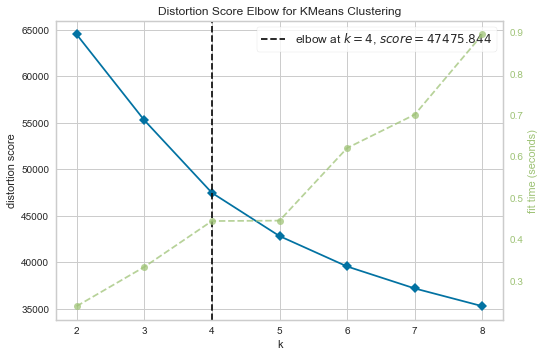

In [107]:
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

visualizer = KElbowVisualizer(KMeans(init='k-means++', n_init=20), k=(2,9),ax=ax)
visualizer.fit(df_std[metric_features])

ax.set_xticks(range(2,9))
visualizer.show()
plt.show()

In [108]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 9):
    km = KMeans(n_clusters=k, 
                init='k-means++', 
                n_init=20, 
                # random_state=42, 
                # algorithm='auto'
                )
    km.fit(df[metric_features])
    silhouette_scores.append(silhouette_score(df_std[metric_features], km.labels_))

fig, ax = plt.subplots()
ax.plot(range(2, 9), silhouette_scores, 'bx-')
ax.set_title('Silhouette Score Method')
ax.set_xlabel('Number of clusters')
ax.set_ylabel('Silhouette Scores')
plt.xticks(range(2, 9))
plt.tight_layout()
plt.show()

ValueError: Found input variables with inconsistent numbers of samples: [10281, 10227]

For n_clusters = 2, the average silhouette_score is : 0.2177406989540564
For n_clusters = 3, the average silhouette_score is : 0.20617658758534319
For n_clusters = 4, the average silhouette_score is : 0.1714592205717668
For n_clusters = 5, the average silhouette_score is : 0.16190480488987627
For n_clusters = 6, the average silhouette_score is : 0.17984077484484368
For n_clusters = 7, the average silhouette_score is : 0.16492053378373975
For n_clusters = 8, the average silhouette_score is : 0.16898082269209702
For n_clusters = 9, the average silhouette_score is : 0.16858345019269227
For n_clusters = 10, the average silhouette_score is : 0.1699593066583786


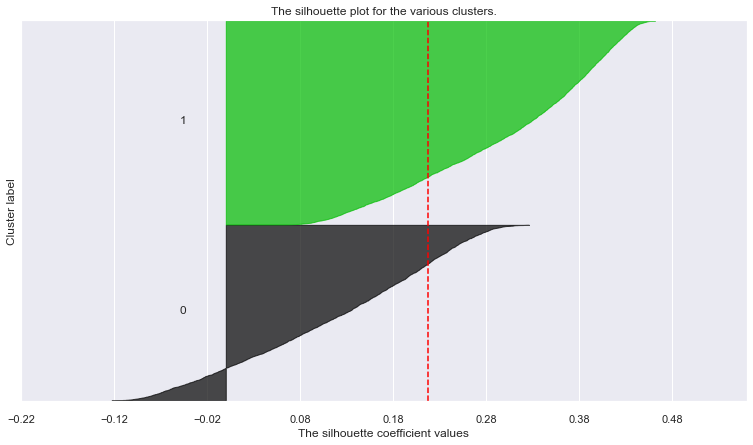

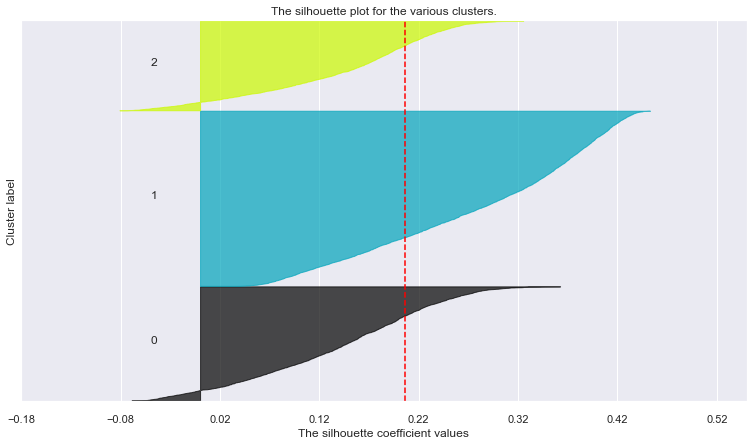

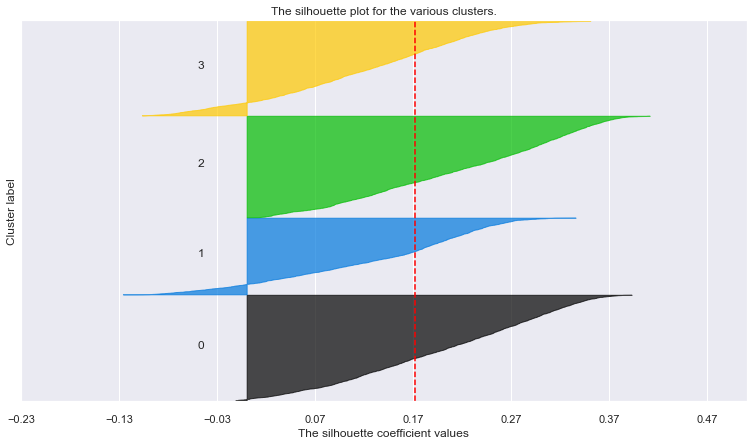

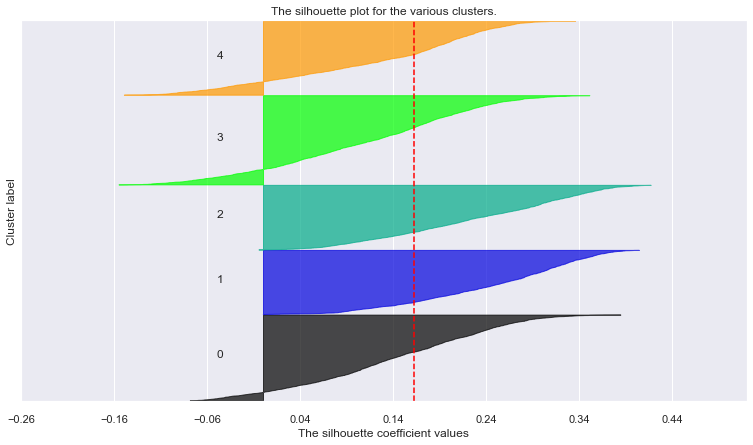

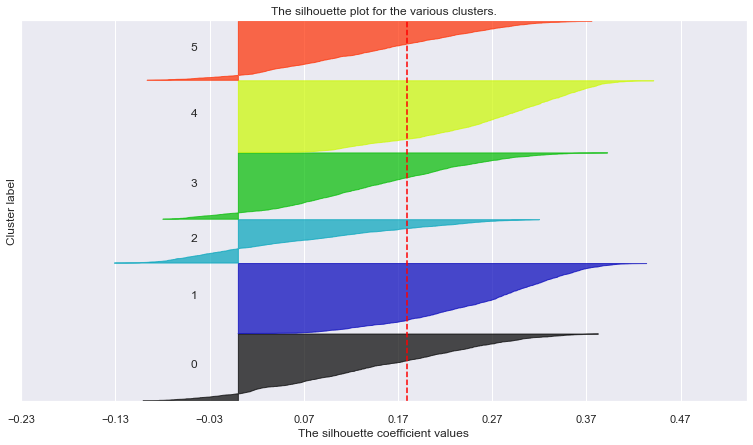

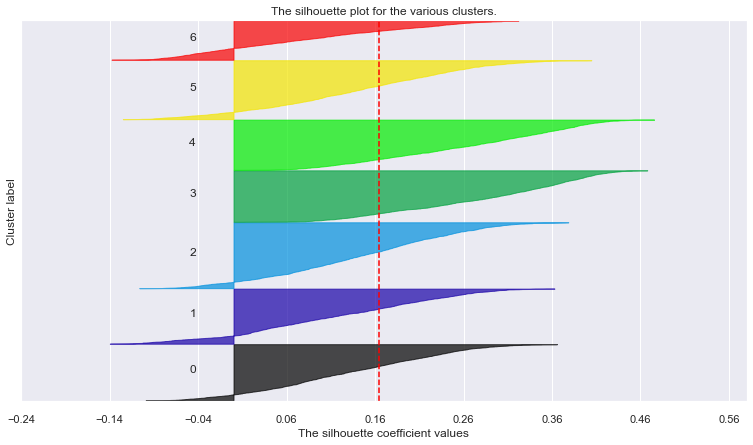

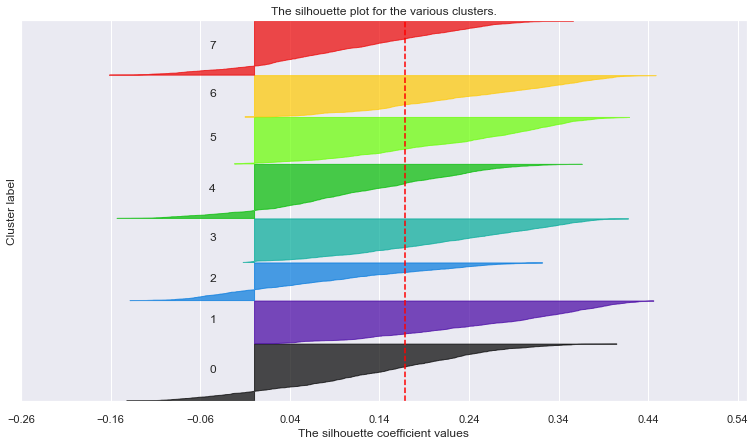

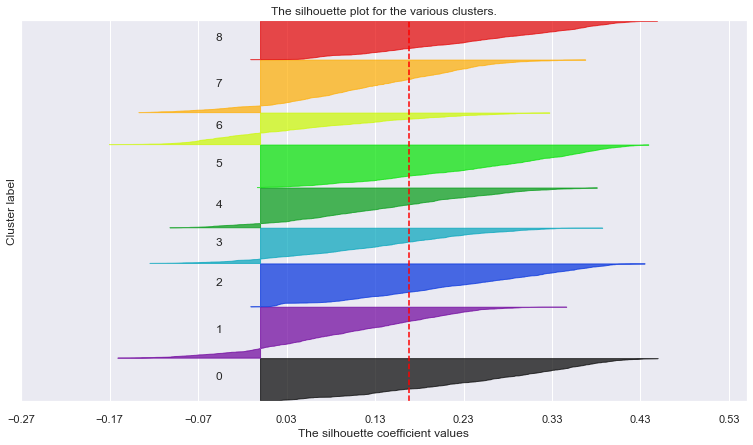

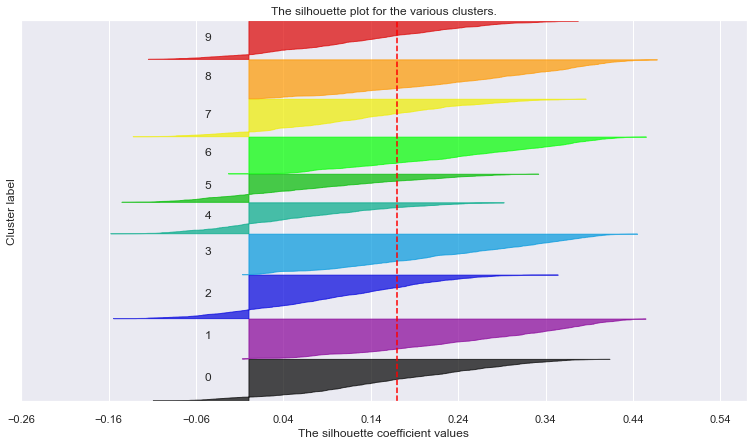

In [ ]:
range_clusters = range(1, 11)
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=20, random_state=1)
    cluster_labels = kmclust.fit_predict(df_std[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_std[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_std[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_std[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [ ]:
# final cluster solution
number_clusters = 2
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=20, random_state=1)
km_labels = kmclust.fit_predict(df_std[metric_features])
km_labels

array([1, 0, 0, ..., 1, 0, 1])

In [ ]:
# Characterizing the final clusters
df_std = pd.concat((df_std, pd.Series(km_labels, name='labels')), axis=1)
df_std.groupby('labels').mean()

,FirstPolYear,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Age,EducDeg_b'1 - Basic',EducDeg_b'2 - High School',EducDeg_b'3 - BSc/MSc',EducDeg_b'4 - PhD',Children_1,GeoLivArea_1,GeoLivArea_2,GeoLivArea_3,GeoLivArea_4
labels,,,,,,,,,,,,,,,,,
0.0,0.504646,0.436181,0.543217,0.308977,0.452060,0.277106,0.307742,0.529872,0.080460,0.324713,0.519828,0.075000,0.716667,0.302299,0.099713,0.198563,0.399425
1.0,0.499609,0.441395,0.543861,0.313607,0.449943,0.275210,0.307714,0.537285,0.066354,0.325358,0.529107,0.079181,0.717810,0.293537,0.101135,0.203256,0.402072


### - no kmeans, fazer um com pca e outro com as variaveis normais
### - DBSCAN
### - plots no PCA?
### - Standart scaler está a acrescentar 16 NaN
### - A caracterização dos clusters continua a ter valores demasiado próximos (HC e kmeans)... perguntar a prof?
---
#### --- Usei Robust Scaler, mas no hierarchical está a criar um cluster com 3 elementos
### - K-prototypes
### - Criar 2 tipos de clusters antes do SOMs
### - Fazer t_SNE / UMAP
### - Colocar imports todos no inicio